# Libraries

In [1]:
# libraries
import pandas as pd
import numpy as np
import datetime
import itertools
from tqdm.notebook import tqdm
from sklearn.metrics import r2_score
import lightgbm as lgb
import shap
import graphviz

# plotly stuff
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# configs
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
pd.options.display.max_rows = 50
pd.options.display.max_columns = 500
pd.options.mode.chained_assignment = None # use at your own risk..

In [110]:
pd.__version__,lgb.__version__,shap.__version__

('1.0.5', '2.3.1', '0.37.0')

# Exploratory Data Analysis

In [111]:
df = pd.read_csv('house_data.csv')
df.date = pd.to_datetime(df.date)
df.yr_built = pd.to_datetime(df.yr_built, format='%Y')
df.yr_renovated = pd.to_datetime(df.yr_renovated, format='%Y', errors='coerce')
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955-01-01,NaT,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951-01-01,1991-01-01,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933-01-01,NaT,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965-01-01,NaT,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987-01-01,NaT,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009-01-01,NaT,98103,47.6993,-122.346,1530,1509
21609,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014-01-01,NaT,98146,47.5107,-122.362,1830,7200
21610,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009-01-01,NaT,98144,47.5944,-122.299,1020,2007
21611,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004-01-01,NaT,98027,47.5345,-122.069,1410,1287


## General Stats

In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  datetime64[ns]
 15  yr_renovated   914 

In [134]:
'{0:.2%}'.format(sum(df.yr_renovated.notnull()) / len(df))

'4.23%'

Missing values on yr_renovated, which is only logical. Only 4.23% completeness, precise % of expected missing values unknown at this point, will assume it's ok.

In [123]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


## Column by Column

In [124]:
for col in df.columns:
    px.histogram(df[col]).show()

- date will be used to leave last 20% as test, to see if model is sustainable across time or suffers from decay.
- price has a lot of extreme high outliers. We might be better of capping the training set up to X value and add to model deployment a caveat that states that anything at X is intented to be read as X or above.
    - In theory, performance metrics would be almost the same, but in practice this preprocessing could help for better model implementation.
- bedrooms/bathrooms have the odd 0 or extreme value outliers, which can be handled just fine with the tree based approach LightGBM.
- sqft_living/lot/above/basement, same logic applies.
- zipcode can be used as region identifier. Must be category-encoded for LightGBM first.
- lat and long are great as they are to serve as geographical mapping for LightGBM.
- sqft_living15/sqft_lot15 no info
- Unmentioned colums look fine.

## sqft_15

In [97]:
px.scatter(df.sample(1000), x='sqft_living15', y='sqft_living', trendline='ols')

In [96]:
px.scatter(df.sample(1000), x='sqft_lot15', y='sqft_lot', trendline='ols')

- There's a clear trend between the two, but I have no information at this point as to what 15 means.
- Could be a good idea to eventually code brute force search to weed out underperfroming features.

## Anomalies Checks

### renovated <= built ?

In [90]:
df[df.yr_renovated <= df.yr_built].sort_values('yr_renovated')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
14449,7686204675,2015-01-29,248000.0,4,1.00,1010,7515,1.0,0,0,4,6,1010,0,1955,0,98198,47.4174,-122.316,1330,7515
14448,2025700790,2014-08-11,290700.0,3,2.50,1670,6666,2.0,0,0,4,7,1670,0,1992,0,98038,47.3488,-122.033,1370,6170
14447,5151600040,2014-09-11,200126.0,3,2.50,2040,15463,1.0,0,0,3,8,1340,700,1968,0,98003,47.3334,-122.322,2370,12672
14446,2917200365,2014-06-10,445434.0,2,1.00,1470,7137,1.0,0,0,3,7,1020,450,1941,0,98103,47.7008,-122.352,1470,7067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7225,5602000275,2014-08-25,259950.0,4,2.00,1540,10212,1.5,0,0,5,7,1540,0,1948,0,98022,47.2056,-121.999,1480,10212
7224,1786200010,2015-05-14,456500.0,4,2.50,2580,11780,2.0,0,0,3,9,2580,0,2003,0,98038,47.3658,-122.040,2410,8403
7223,1525079069,2014-07-08,650000.0,4,3.00,3720,57499,1.0,0,0,3,9,1880,1840,2003,0,98014,47.6469,-121.897,2560,26372
7201,6868200029,2014-09-29,467500.0,3,1.75,2260,8512,1.0,0,0,3,7,1130,1130,1948,0,98125,47.7129,-122.304,2240,8040


Looks fine, no houses renovated before they were built.

### sqft_living != sqft_above + sqft_basement ?

In [101]:
df[df.sqft_living != df.sqft_above + df.sqft_basement]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15


OK, no anomaly on here.

### sqft_living > sqft_lot ?

In [103]:
df[df.sqft_living > df.sqft_lot]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
63,9528102996,2014-12-07,549000.0,3,1.75,1540,1044,3.0,0,0,3,8,1540,0,2014,0,98115,47.6765,-122.320,1580,3090
116,3362400431,2014-06-26,518500.0,3,3.50,1590,1102,3.0,0,0,3,8,1590,0,2010,0,98103,47.6824,-122.347,1620,3166
175,7234600798,2015-02-10,425000.0,3,2.50,1120,1100,2.0,0,0,3,8,820,300,2008,0,98122,47.6106,-122.310,1590,1795
406,7821200390,2014-08-06,450000.0,3,2.00,1290,1213,3.0,0,0,3,8,1290,0,2001,0,98103,47.6609,-122.344,1290,3235
547,7899800860,2015-03-19,259950.0,2,2.00,1070,649,2.0,0,0,3,9,720,350,2008,0,98106,47.5213,-122.357,1070,928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21595,1972201967,2014-10-31,520000.0,2,2.25,1530,981,3.0,0,0,3,8,1480,50,2006,0,98103,47.6533,-122.346,1530,1282
21601,5100403806,2015-04-07,467000.0,3,2.50,1425,1179,3.0,0,0,3,8,1425,0,2008,0,98125,47.6963,-122.318,1285,1253
21604,9834201367,2015-01-26,429000.0,3,2.00,1490,1126,3.0,0,0,3,8,1490,0,2014,0,98144,47.5699,-122.288,1400,1230
21607,2997800021,2015-02-19,475000.0,3,2.50,1310,1294,2.0,0,0,3,8,1180,130,2008,0,98116,47.5773,-122.409,1330,1265


In [104]:
px.scatter(df[df.sqft_living > df.sqft_lot], x='sqft_living', y='sqft_lot')

Since living = above + basement checks out, I will assume these datapoints are wrong and clean them as null.

# Data Preparation
## Analysis

### Nullify Values

- df[df.sqft_living > df.sqft_lot] as explained above.

### Feature Engineering

If we simply use the year for built/renovated columns, this will be progressively outdated in the future. We must use the time between that data and the data capture date. If the divisor is zero or NaN and the calculation returns NaN, LightGBM handles just fine.

- yr_built_ago = years(date - yr_built)
- yr_renovated_ago = years(date - yr_renovated) 
- yr_ren_blt_ago_dif = yr_renovated_ago - yr_built_ago  
- yr_ren_blt_ago_rat = yr_renovated_ago / yr_built_ago 

Since LightGBM is a tree based approach which suffers from both additive and linear limitations, differences and ratios to represent seemingly important relationships can help.

- bath_bed_sum = bathrooms + bedrooms # sum of rooms
- bath_bed_rat = bathrooms + bedrooms # bathrooms per bedroom
- bed_floor_rat = bedrooms / floors # rooms per floor
- bath_bed_sum_sqft_living_rat = sqft_living / bath_bed_sum # sqft per room
- floors_sqft_living_rat = sqft_living / floors # sqft per floor
- sqft_basement_rat = sqft_basement / sqft_living # relative size of basement to living area
- sqft_living_rat = sqft_living / sqft_lot # relative size of living to lot area
- sqft_living_15_rat = sqft_living / sqft_living_15 # we're comparing something but don't know what, hopefully this helps, should check
- sqft_lot_15_rat = sqft_lot / sqft_lot_15 # we're comparing something but don't know what, hopefully this helps, should check

Scores generated from relevant, to overcome additive limitation of LightGBM which can't straightforwardly combine both.

- water_view_score = waterfront * 5 + view # waterfront gets 5x weight to equally weight to view
- condition_grade_score = condition * 2 + grade # condition gets 2x weight which roughly puts it on the same scale as grade

### Inputs Exclusion

- id, looks like a random id number with no value.
- yr_built/renovated, they are used as timedelta in F.E.

## Functions

In [2]:
def nullify(df):
    df.sqft_lot = np.where(df.sqft_living > df.sqft_lot, np.nan, df.sqft_lot)
    return df

def feng(df):
    # categorical conversion
    df.zipcode = pd.Categorical(df.zipcode)
    # built and renovated
    df['yr_built_ago'] = (df.date - df.yr_built).dt.days / 365.25
    df['yr_renovated_ago'] = (df.date - df.yr_renovated).dt.days / 365.25
    df['yr_ren_blt_ago_dif'] = df.yr_renovated_ago - df.yr_built_ago  
    df['yr_ren_blt_ago_rat'] = df.yr_renovated_ago / df.yr_built_ago 
    # rooms
    df['bath_bed_sum'] = df.bathrooms + df.bedrooms
    df['bath_bed_rat'] = df.bathrooms / df.bedrooms 
    df['bed_floor_rat'] = df.bedrooms / df.floors
    df['bath_bed_sum_sqft_living_rat'] = df.sqft_living / df.bath_bed_sum
    df['floors_sqft_living_rat'] = df.sqft_living / df.floors
    # sqft
    df['sqft_basement_rat'] = df.sqft_basement / df.sqft_living 
    df['sqft_living_rat'] = df.sqft_living / df.sqft_lot
    df['sqft_living15_rat'] = df.sqft_living / df.sqft_living15
    df['sqft_lot15_rat'] = df.sqft_lot / df.sqft_lot15
    # extra points
    df['water_view_score'] = df.waterfront * 5 + df.view
    df['condition_grade_score'] = df.condition * 2 + df.grade
    return df

def exclusions(df):
    del df['id']
    del df['yr_built']
    del df['yr_renovated']
    return df

# Machine Learning
## Functions

In [26]:
def r2_metric(preds, train_data):
    labels = train_data.get_label()
    r2 = r2_score(labels,preds)
    eval_name = 'r2'
    eval_result = r2
    is_higher_better = True
    return eval_name,eval_result,is_higher_better 

def lgbm_model_xv(df, inputs, output, params_grid):       
    params_df = pd.DataFrame()
    tr_ds = lgb.Dataset(df[inputs], label=df[output]) 
    for params in tqdm(params_grid):
        cv = lgb.cv(
            params = params,
            train_set = tr_ds,
            num_boost_round = 10000,
            early_stopping_rounds = 25,
            verbose_eval = False,
            stratified = False,
            eval_train_metric = True,
            feval = r2_metric,
            seed = 7,
        )
        cv = pd.DataFrame(cv).tail(1)
        params = pd.DataFrame(params, index=[0])
        params['num_boost_round'] = cv.index.values[0] + 1
        params['perfo'] = cv.iat[0,2]
        params['perfo_train'] = cv.iat[0,0]
        params['perfo_vw'] = 2 * params['perfo'] - params['perfo_train'] # this is variance-weighted performance
        params = pd.concat([params,cv.reset_index(drop=True)], axis=1)
        params_df = params_df.append(params)
    return params_df

def get_best_params(params_df, ascending):
    params_df = params_df.sort_values('perfo_vw', ascending=ascending).tail(1)
    perfo = params_df['perfo'][0]
    perfo_vw = params_df['perfo_vw'][0]
    params_df = params_df.iloc[:,:params_df.columns.get_loc('perfo')] # get all columns until perfo data comes in
    params = params_df.to_dict('index')[0]   
    return params,perfo,perfo_vw

def train_lgb(df, inputs, params):
    rounds = params[0]['num_boost_round']
    params[0].pop('num_boost_round', None)
    tr_ds = lgb.Dataset(df[inputs], label=df[output])
    booster = lgb.train(
        params = params[0],
        train_set = tr_ds,
        num_boost_round = rounds
    )
    return booster

## Execution
### Data Load and Prep

In [112]:
# read input
df = pd.read_csv('house_data.csv')
df.date = pd.to_datetime(df.date)
df.yr_built = pd.to_datetime(df.yr_built, format='%Y')
df.yr_renovated = pd.to_datetime(df.yr_renovated, format='%Y', errors='coerce')

# general data preparation
df = nullify(df)
df = feng(df)
df = exclusions(df)

# testing flag
df = df.sort_values('date')
df['testing'] = 1
df.testing = df.testing.cumsum()
df.testing = np.where(df.testing < df.testing.max() * 0.8,0,1)

# define inputs and output column
inputs = list(set(df.columns) - set(['date','price','testing']))
output = 'price'

# parameters to explore
params_grid = {  
    'metric': ['r2_metric'],
    'objective': ['mse','mae'], # mae penalizes outliers less, let's see who wins
    'num_leaves': [4,8,16,32],
    'learning_rate': [0.1],
    'feature_fraction': [0.5,1],
    'bagging_fraction': [0.5,1],
    'bagging_freq': [1],
    'verbosity':[-1],
    'seed':[7],    
}
params_grid = [dict(zip(params_grid.keys(), v)) for v in itertools.product(*params_grid.values())]

### Model Training

In [18]:
# run parameter search
params_df = lgbm_model_xv(df[df.testing==0],inputs,output,params_grid)

In [25]:
params_df = params_df.sort_values('perfo_vw', ascending=False).reset_index(drop=True)
params_df

,metric,objective,num_leaves,learning_rate,feature_fraction,bagging_fraction,bagging_freq,verbosity,seed,num_boost_round,perfo,perfo_train,perfo_vw,train r2-mean,train r2-stdv,valid r2-mean,valid r2-stdv
0,r2_metric,mae,4,0.1,0.5,1.0,1,-1,7,1355,0.891116,0.911331,0.870901,0.911331,0.003075,0.891116,0.016748
1,r2_metric,mae,4,0.1,1.0,1.0,1,-1,7,1942,0.894156,0.919729,0.868583,0.919729,0.004237,0.894156,0.016632
2,r2_metric,mae,8,0.1,0.5,1.0,1,-1,7,1399,0.900183,0.932452,0.867914,0.932452,0.003428,0.900183,0.013480
3,r2_metric,mae,8,0.1,0.5,0.5,1,-1,7,1125,0.890892,0.916184,0.865601,0.916184,0.003511,0.890892,0.018318
4,r2_metric,mae,16,0.1,0.5,1.0,1,-1,7,791,0.899859,0.936565,0.863153,0.936565,0.001952,0.899859,0.015017
5,r2_metric,mae,4,0.1,0.5,0.5,1,-1,7,1402,0.881688,0.900542,0.862835,0.900542,0.002849,0.881688,0.020691
6,r2_metric,mae,8,0.1,1.0,1.0,1,-1,7,1307,0.895988,0.933614,0.858362,0.933614,0.002636,0.895988,0.016620
7,r2_metric,mae,16,0.1,0.5,0.5,1,-1,7,560,0.887406,0.917365,0.857448,0.917365,0.003689,0.887406,0.018996
8,r2_metric,mse,4,0.1,0.5,0.5,1,-1,7,297,0.886793,0.917075,0.856511,0.917075,0.001710,0.886793,0.009519
9,r2_metric,mae,4,0.1,1.0,0.5,1,-1,7,1387,0.872411,0.891229,0.853592,0.891229,0.003940,0.872411,0.024563


- The best model according to perfo_vw is shown first.
- This metric, perfo_vw, is a measure of performance I created to value less-variance models over simply selecting lowest bias.
- I'll select model index 4 here, sacrificing a little bit of variance in order to ramp up the bias almost to 0.9.

Let's now use these parameters to train the final model to be tested on the test, out of time sample.

In [56]:
# train chosen model
params = pd.DataFrame(params_df.iloc[4]).transpose().reset_index(drop=True)
params = get_best_params(params, True)
booster = train_lgb(df[df.testing==0], inputs, params)

### Model Testing

In [96]:
df_test = df[df.testing==1].copy().reset_index(drop=True)
df_test['price_yhat'] = booster.predict(df_test[inputs])

In [113]:
perfo_tr = params[1]
perfo_te = r2_score(df_test.price,df_test.price_yhat)
print('Training R2:',round(perfo_tr,4))
print('Testing  R2:',round(perfo_te,4))
print('Loss:......:','{0:.2%}'.format(1 - perfo_te / perfo_tr))

Training R2: 0.8999
Testing  R2: 0.8805
Loss:......: 2.15%


2.15% loss for out of time testing looks acceptable for me, although more exploration could be done.

In [99]:
mape = df_test[['price','price_yhat']]
mape['percentage_error'] = abs(mape.price - mape.price_yhat) / mape.price
'{0:.2%}'.format(mape.percentage_error.mean())

'12.77%'

12.77% MAPE also looks acceptable, although further investigation could be in regards to in what price range is the most error coming from.

In [100]:
px.scatter(df_test, x='price', y='price_yhat', trendline='ols')

Residuals visual analysis shows that the model is doing pretty well overall, as seen before with R2 and MAPE. 

### Model Discovery

Let's see how we can explain our model. Since it's a tree-based algorithm, we can start be taking a look at the first tree.

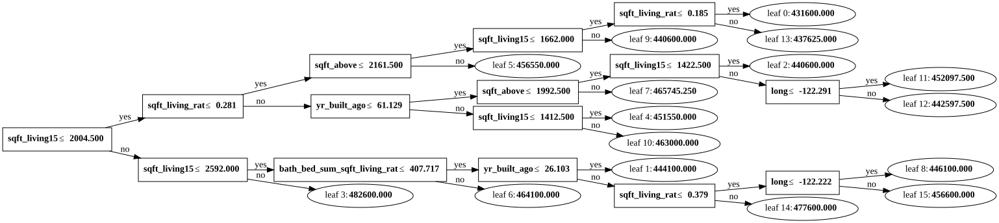

In [101]:
lgb.create_tree_digraph(booster, tree_index=0)

A simple tree-based algorithm simply takes the features given and tries to split them to minimize the chosen loss function and in turn maximize the chosen performance metric. This tree looks really nice and with some effort we could extract information, but our algorithm is quite complex and actually has 791 trees which are aggregated to compute the final prediction. We can't go through all of them. Therefore, we will use SHAP, a package with a game-theory approach to explaining complex, black box models such as this one.

In [116]:
# shap init
shap.initjs()
explainer = shap.TreeExplainer(booster)
shap_values = explainer.shap_values(df_test[inputs])

We can see at a record level which features are driving changes up or down in price, which has a base value of its own mean at 532k.

In [128]:
shap_plot = shap.force_plot(explainer.expected_value, shap_values[0], df_test[inputs].iloc[0])
shap.save_html('shap_force_single.html', shap_plot)
shap_plot

- West side longitute lowers value. Indeed, in general, left side is cheaper.
- But, north side latitude drives value up, as was also seen on the map. You can review this below on the scatterplot.
- A particular zipcode drives value way up.

Overall, all what we are seeing makes sense to what we expect, but this approach allows us to see exactly what are the score components and how much they affect the final score. In this way, a user analyst from the real state can take a look at this 'force-plot' and make the final decision himself, by understanding why the model is settling at a particular value and what information it could be missing.

In [118]:
px.scatter(df_test, x='long', y='lat', color='price_yhat')

What about overall feature impact on price? Let's take a look at a much more complex visualization:

In [129]:
shap_plot = shap.force_plot(explainer.expected_value, shap_values[:1000], df_test[inputs].iloc[:1000,:])
shap.save_html('shap_force_multiple.html', shap_plot)
shap_plot

You can see here lots of things, such as:

- lat effects by lat: there's not a linear relationship. As seen on the map, lat up to mid-north drives price down, then up, but towards the north it again goes down. This is a classic non-linear relationship that a tree algorithm can find.
- lat effect by sample order by output value: as this is a complex multivariate model, some high-price houses can have drive-down lat and viceversa. These cases surely compensate with other opposite effects to get to final value.

Finally, let's take a look at overall feature value based on impact on model output.

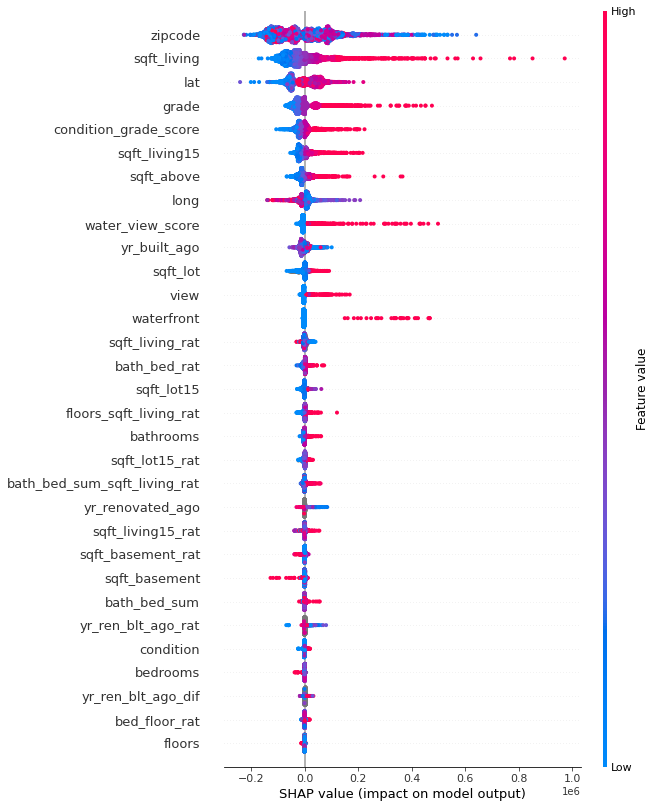

In [131]:
shap.summary_plot(shap_values, df_test[inputs], max_display=len(inputs))

Our condition+grade and water+view scores made it pretty far up, good job!

# Proposed Improvements

## Feature Extraction / Engineering

- Since zipcode and location is so important, we could get other geodata such as neighborhood.
- Since grade is so important, we could see if the data that generates such aggregated grade is available and use that higher detail information instead.
- Since the sqft features are so important, we could try to get more data in relation to that, such as sqft of the rooms.
    - Actually I also missed the yard sqft calculation, which is a differentation which would help LightGBM because of it's additive limitation.
- Shores distances.
    - Get arrays of geopoints to delimit each of the relevant lakes and water areas, such as Lake Washington and the estuary.
    - For each delimited area, compute minimum distance between each house's geopoints and the area's array of geopoints.
    - Add to model and see if there's a performance increase.
- Lot height.
    - https://ngmdb.usgs.gov/ngmdb/ngmdb_home.html from here topographical maps can be obtained and used to calculate lot height.
- We should have a discovery session with the real state experts and see what features we are missing to obtain near-perfect performance.
    
## Machine Learning

- Search for a wider parameter space on LightGBM and lower learning rate.
- Try more algorithms and ensemble algorithms of multiple learners.
- Try bruce-force feature subspace search. Sometimes features can be selected by the tree algorithm but actually are detrimental to XV performance.
